In [1]:
import mne
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import numpy as np
from colour import Color
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet
from matplotlib.gridspec import GridSpec
import pyprep
from scipy import stats
from scipy.stats import zscore
import pandas as pd
from statannot import add_stat_annotation
import matplotlib.pyplot as plt
from mne_connectivity import spectral_connectivity_epochs

plt.rcParams["font.family"] = "Arial"
mne.__version__

'1.3.1'

In [2]:
n_part = 29 # number of participants

In [3]:
def get_stat(var): # get median and 25th, 75th percentiles
    print(f'{np.median(var):.2f} [{np.percentile(var, 25):.2f}-{np.percentile(var, 75):.2f}]')

In [5]:
fs = 500
electrodes = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'T3', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T4', 'TP9', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'TP10', 'T5', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'T6', 'PO3', 'POz', 'PO4', 'O1', 'Oz', 'O2']

dict_rows = {
    'Fp':0,
    'F':1,
    'FC':2,
    'T':-1,
    'TP':-1,
    'C':3,
    'CP':4,
    'P':5,
    'PO':6,
    'O':7,
}

dict_cols = {
    '9':-1,
    '7':0,
    '5':1,
    '3':2,
    '1':3,
    'z':4,
    '2':5,
    '4':6,
    '6':7,
    '8':8, 
    '10':-1
}

cols_seq = [dict_cols[re.split('(\d+)', i)[1]] if 'z' not in i else dict_cols[i[-1]] for i in electrodes]
rows_seq = [dict_rows[re.split('(\d+)', i)[0]] if 'z' not in i else dict_rows[i[:-1]] for i in electrodes]

cols_seq[electrodes.index('T3')] = 0
rows_seq[electrodes.index('T3')] = 3
cols_seq[electrodes.index('T4')] = 8
rows_seq[electrodes.index('T4')] = 3

cols_seq[electrodes.index('T5')] = 0
rows_seq[electrodes.index('T5')] = 5
cols_seq[electrodes.index('T6')] = 8
rows_seq[electrodes.index('T6')] = 5

nrows = max(rows_seq)+1
ncols = max(cols_seq)+1

figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 25), sharex=True, sharey=True, dpi=200)

for e in range(len(electrodes)):
    if electrodes[e] in ['TP9', 'TP10']:
        continue
    axes[rows_seq[e]][cols_seq[e]].set_title(electrodes[e], fontsize=18, fontweight='bold')
    
pairs = [str(rows_seq[i])+str(cols_seq[i]) for i in range(len(electrodes))]
    
for row in range(nrows):
    for col in range(ncols):
        if str(row) + str(col) not in pairs:
            axes[row][col].set_axis_off()

# figure.subplots_adjust(right=0.8)
# cbar_ax = figure.add_axes([0.83, 0.4, 0.01, 0.3])
# cbar = figure.colorbar(cp, cax=cbar_ax)
# cbar.ax.set_title(mode, fontsize=18)
            
plt.suptitle('Smth', fontsize=32, y=0.95, fontweight='bold')
plt.show()

# Long Tactile Stimulation and Tactile Imagery wavelets

In [6]:
stim_long_w = np.load('preprocesed_data/long_wavelets/learning.npy')
im_long_w = np.load('preprocesed_data/long_wavelets/imagery.npy')
mu_ind_values = np.genfromtxt('preprocesed_data/long_wavelets/mu_freq.csv')
beta_ind_values = np.genfromtxt('preprocesed_data/long_wavelets/beta_freq.csv')

times = np.linspace(-1, 9, 501)
freqs = np.genfromtxt('preprocesed_data/long_wavelets/freqs.csv')

vmin, vmax = -40, 40

Text(0.5, 0.9, 'Sensorimotor (C3, CP3) wavelets and individual mu and beta frequencies (red)')

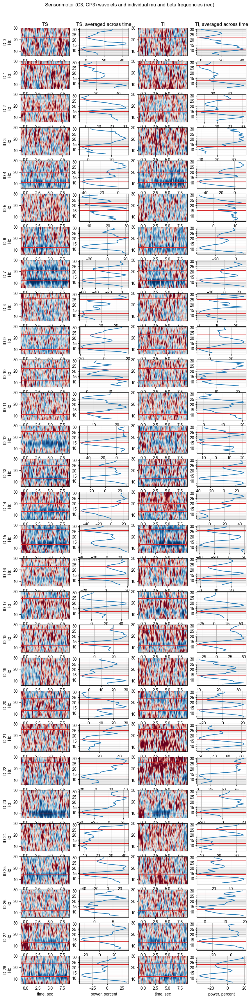

In [7]:
left_sm = [electrodes.index(i) for i in ['C3', 'CP3']]

fig, axes = plt.subplots(nrows=n_part, ncols=4, figsize=(10, n_part*1.5), dpi=100)

for i in range(n_part):
    axes[i][0].pcolormesh(times, freqs, np.mean(stim_long_w[i, left_sm], axis=0)*100, vmin=-80, vmax=80, cmap='RdBu_r', shading='gouraud')
    axes[i][1].plot(np.mean(stim_long_w[i, left_sm], axis=(0, -1))*100, freqs)
    axes[i][1].set_yticks(range(10, 31, 5), minor=False)
    axes[i][1].set_yticks(freqs, minor=True)
    axes[i][1].grid(which='major', alpha=0.9)
    axes[i][1].grid(which='minor', alpha=0.4)
    
    axes[i][2].pcolormesh(times, freqs, np.mean(im_long_w[i, left_sm], axis=0)*100, vmin=-80, vmax=80, cmap='RdBu_r', shading='gouraud')
    axes[i][3].plot(np.mean(im_long_w[i, left_sm], axis=(0, -1))*100, freqs)
    axes[i][3].set_yticks(range(10, 31, 5), minor=False)
    axes[i][3].set_yticks(freqs, minor=True)
    axes[i][3].grid(which='major', alpha=0.9)
    axes[i][3].grid(which='minor', alpha=0.4)
    
    for j in range(4):
        axes[i][j].axhline(mu_ind_values[i], color='tab:red')
        axes[i][j].axhline(beta_ind_values[i], color='tab:red')
    
    axes[i][0].set_ylabel('ID-'+str(i)+'\nHz')
    
axes[0][0].set_title('TS')
axes[0][1].set_title('TS, averaged across time')
axes[0][2].set_title('TI')
axes[0][3].set_title('TI, averaged across time')

axes[-1][0].set_xlabel('time, sec')
axes[-1][1].set_xlabel('power, percent')
axes[-1][2].set_xlabel('time, sec')
axes[-1][3].set_xlabel('power, percent')

plt.suptitle('Sensorimotor (C3, CP3) wavelets and individual mu and beta frequencies (red)', y=0.9)

In [8]:
r_spectra = np.genfromtxt('preprocesed_data/long_wavelets/rest_spectra.csv')
r_spectra_freqs = np.genfromtxt('preprocesed_data/long_wavelets/rest_spectra_freqs.csv')

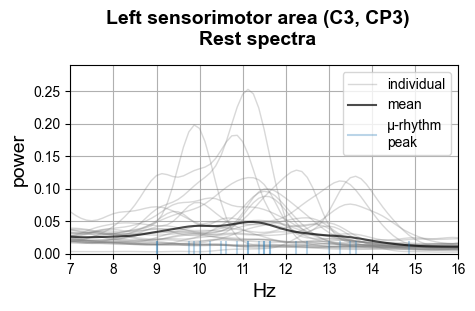

In [9]:
fig, axes = plt.subplots(figsize=(5, 2.5), dpi=100)

axes.plot(r_spectra_freqs, r_spectra.T, color='tab:grey', alpha=0.3, linewidth=1, label='individual')
axes.plot(r_spectra_freqs, r_spectra.mean(0), color='black', alpha=0.7, linewidth=1.5, label='mean')

h, l = axes.get_legend_handles_labels()
h, l = h[-2:], l[-2:]
plt.legend(h, l)

for i in r_spectra_freqs[np.argmax(np.array(r_spectra)[:, np.where(r_spectra_freqs==8)[0][0]:np.where(r_spectra_freqs==15)[0][0]], axis=1)] + 8:
    if i == 8:
        continue
    plt.axvline(i, 0, 0.06, color='tab:blue', alpha=0.3, label='µ-rhythm\npeak')

h2, l2 = axes.get_legend_handles_labels()
h2, l2 = [h2[-1]], [l2[-1]]

h, l = h+h2, l+l2
plt.legend(h, l)

plt.xticks(range(1, 31))
plt.xlim(7, 16)
plt.ylim(0, 0.29)
plt.ylabel('power', fontsize=14)
plt.xlabel('Hz', fontsize=14)

suptitle = plt.suptitle('Left sensorimotor area (C3, CP3)\nRest spectra', fontsize=14, fontweight='bold', y=1.1)
plt.savefig('figs/rest_spectra.jpg', bbox_extra_artists=[suptitle], bbox_inches='tight')
plt.grid()

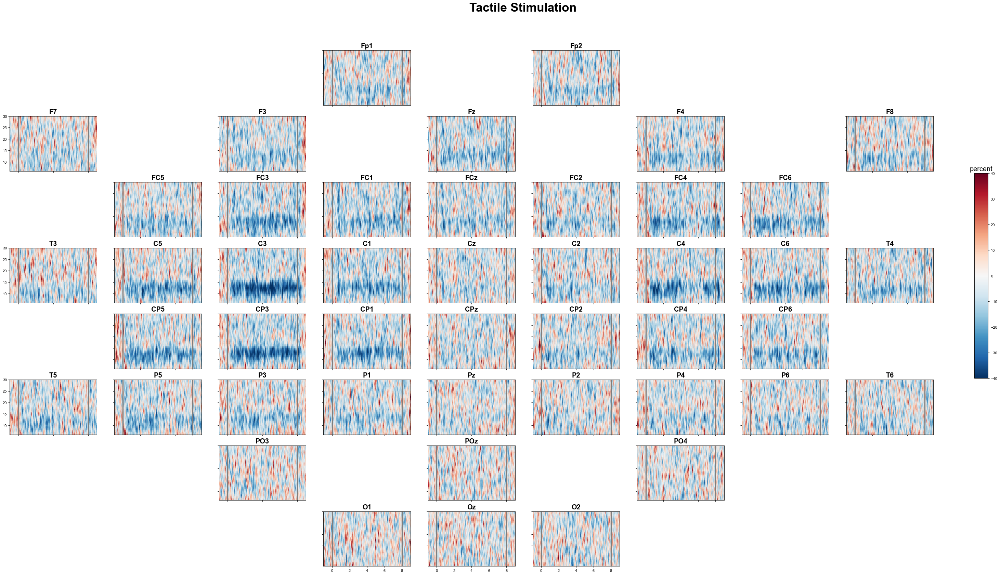

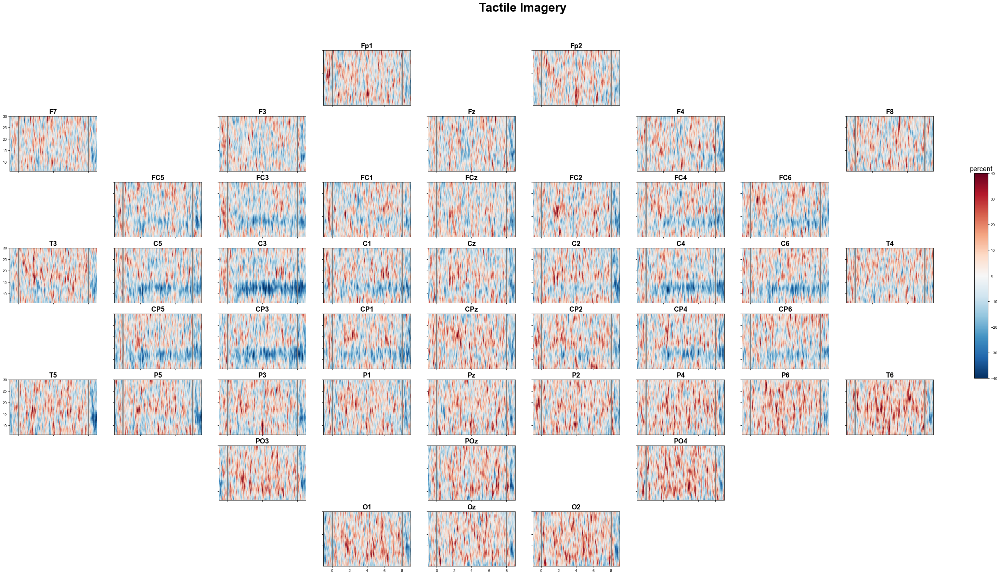

In [10]:
for tfr, label in zip([stim_long_w, im_long_w], ['Tactile Stimulation', 'Tactile Imagery']):

    figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(50, 25), sharex=True, sharey=True, dpi=80)

    for e in range(len(electrodes)):
        if electrodes[e] in ['TP9', 'TP10']:
            continue
        cp = axes[rows_seq[e]][cols_seq[e]].pcolormesh(times, freqs, np.median(tfr[:, e], axis=0)*100, vmin=vmin, vmax=vmax, cmap='RdBu_r', shading='gouraud') # plt.cm.jet
        axes[rows_seq[e]][cols_seq[e]].set_title(electrodes[e], fontsize=18, fontweight='bold')
        axes[rows_seq[e]][cols_seq[e]].axvline(0, color='tab:gray', linewidth=3)
        axes[rows_seq[e]][cols_seq[e]].axvline(8, color='tab:gray', linewidth=3)

    pairs = [str(rows_seq[i])+str(cols_seq[i]) for i in range(len(electrodes))]

    for row in range(nrows):
        for col in range(ncols):
            if str(row) + str(col) not in pairs:
                axes[row][col].set_axis_off()

    figure.subplots_adjust(right=0.8)
    cbar_ax = figure.add_axes([0.83, 0.4, 0.01, 0.3])
    cbar = figure.colorbar(cp, cax=cbar_ax)
    cbar.ax.set_title('percent', fontsize=18)

    suptitle = plt.suptitle(label, fontsize=32, y=0.95, fontweight='bold')
    plt.savefig('figs/'+label+'_median_long_wavelets.jpg', bbox_extra_artists=[suptitle], bbox_inches='tight')
    plt.show()

In [11]:
left_sm = [i for i in range(len(electrodes)) if electrodes[i] in ['C3', 'CP3']] # left sensorimotor area

In [12]:
from scipy.ndimage import convolve1d

learning_ci = np.array([np.median(stim_long_w[i, left_sm, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2)], axis=(0, 1)) for i in range(n_part)])
imagery_ci = np.array([np.median(im_long_w[i, left_sm, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2)], axis=(0, 1)) for i in range(n_part)])

learning_ci *=100
imagery_ci *=100

# I smooth curves as due to median they look very noisy
N = 30 
learning_ci = convolve1d(learning_ci, np.ones(N)/N, axis=-1)
imagery_ci = convolve1d(imagery_ci, np.ones(N)/N, axis=-1)

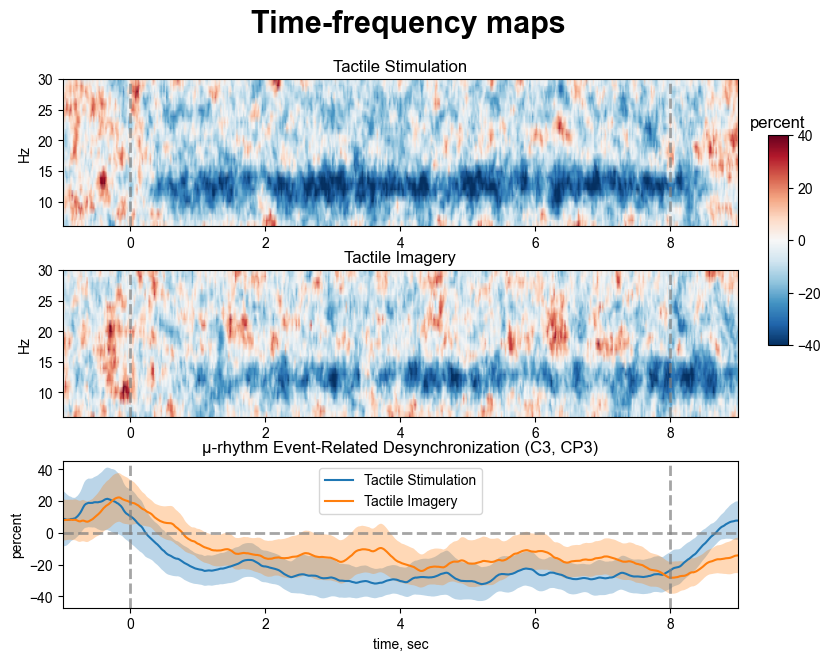

In [13]:
figure, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 7), dpi=100)

cp = axes[0].pcolormesh(np.linspace(-1, 9, 501), freqs, np.median(stim_long_w[:, left_sm], axis=(0, 1))*100, vmin=vmin, vmax=vmax, cmap='RdBu_r', shading='gouraud', label='TS')
cp = axes[1].pcolormesh(np.linspace(-1, 9, 501), freqs, np.median(im_long_w[:, left_sm], axis=(0, 1))*100, vmin=vmin, vmax=vmax, cmap='RdBu_r', shading='gouraud', label='TI')

figure.subplots_adjust(right=0.8)
cbar_ax = figure.add_axes([0.83, 0.5, 0.02, 0.3])
cbar = figure.colorbar(cp, cax=cbar_ax)
cbar.ax.set_title('percent')

axes[0].set_title('Tactile Stimulation')
axes[1].set_title('Tactile Imagery')

for data_ci, name in zip([learning_ci, imagery_ci], ['Tactile Stimulation', 'Tactile Imagery']):
    axes[2].plot(np.linspace(-1, 9, 501), data_ci.mean(axis=0), label=name)
    ci = 1.96 * np.std(data_ci, axis=0)/np.sqrt(len(data_ci)) # confidence interval
    axes[2].fill_between(np.linspace(-1, 9, 501), (data_ci.mean(axis=0)-ci), (data_ci.mean(axis=0)+ci), alpha=.3)
axes[2].set_xlim(-1, 9)
    
for i in range(3):
    axes[i].axvline(0, color='tab:gray', linewidth=2, alpha=0.7, linestyle='--')
    axes[i].axvline(8, color='tab:gray', linewidth=2, alpha=0.7, linestyle='--')

axes[0].set_ylabel('Hz')
axes[1].set_ylabel('Hz')
axes[2].set_ylabel('percent')
axes[2].set_title('µ-rhythm Event-Related Desynchronization (C3, CP3)')
    
axes[2].set_xlabel('time, sec')
axes[2].axhline(0, color='tab:gray', linewidth=2, alpha=0.7, linestyle='--')
axes[2].legend()

plt.subplots_adjust(hspace=0.3)
suptitle = plt.suptitle('Time-frequency maps', fontsize=22, fontweight='bold', x=0.47)

plt.savefig('figs/tfr.jpg', bbox_inches='tight', bbox_extra_artists=[suptitle])

In [14]:
learning_all_e = np.array([np.median(stim_long_w[i, :, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2), 50:-50], axis=(1, 2)) for i in range(n_part)])
imagery_all_e = np.array([np.median(im_long_w[i, :, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2), 50:-50], axis=(1, 2)) for i in range(n_part)])

learning_all_e_beta = np.array([np.median(stim_long_w[i, :, (np.where(freqs == beta_ind_values[i])[0][0]-1):(np.where(freqs == beta_ind_values[i])[0][0]+2), 50:-50], axis=(1, 2)) for i in range(n_part)])
imagery_all_e_beta = np.array([np.median(im_long_w[i, :, (np.where(freqs == beta_ind_values[i])[0][0]-1):(np.where(freqs == beta_ind_values[i])[0][0]+2), 50:-50], axis=(1, 2)) for i in range(n_part)])

In [15]:
info = mne.create_info(electrodes, 500, ch_types='eeg', verbose=None)
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, FC5, FC3, FC1, FCz, FC2, FC4, FC6, ...
 chs: 47 EEG
 custom_ref_applied: False
 dig: 50 items (3 Cardinal, 47 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 47
 projs: []
 sfreq: 500.0 Hz
>

<ipython-input-16-abcfa938a1a2>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


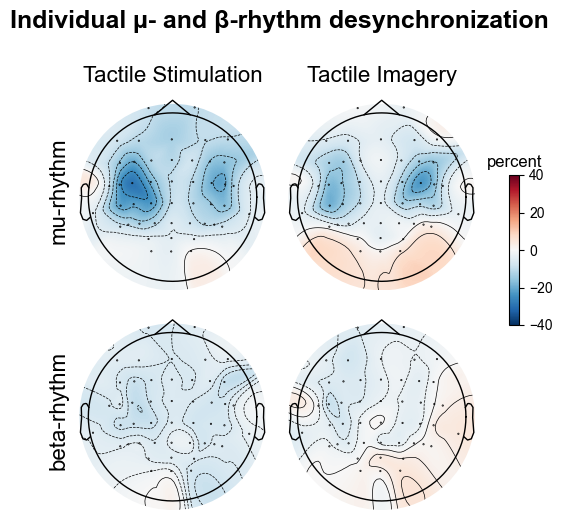

In [16]:
figure, axes = plt.subplots(nrows=2, ncols=2, dpi=100, figsize=(5, 5), sharex=True, sharey=True)

mne.viz.plot_topomap(np.median(learning_all_e*100, axis=0), info, axes=axes[0][0], vlim=(vmin, vmax), show=False)
im, cm = mne.viz.plot_topomap(np.median(imagery_all_e*100, axis=0), info, axes=axes[0][1], vlim=(vmin, vmax), show=False)

mne.viz.plot_topomap(np.median(learning_all_e_beta*100, axis=0), info, axes=axes[1][0], vlim=(vmin, vmax), show=False)
im, cm = mne.viz.plot_topomap(np.median(imagery_all_e_beta*100, axis=0), info, axes=axes[1][1], vlim=(vmin, vmax), show=False)

figure.subplots_adjust(right=0.8)
cbar_ax = figure.add_axes([0.96, 0.4, 0.02, 0.3])
cbar = figure.colorbar(im, cax=cbar_ax)
cbar.ax.set_title('percent')


axes[0][0].set_title('Tactile Stimulation', fontsize=16)
axes[0][0].set_ylabel('mu-rhythm', fontsize=16)
axes[0][1].set_title('Tactile Imagery', fontsize=16)
axes[1][0].set_ylabel('beta-rhythm', fontsize=16)
suptitle = plt.suptitle('Individual µ- and β-rhythm desynchronization', y=1.03, fontsize=18, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.1, right=0.9)

plt.savefig('figs/chosen_electrodes_erp.jpg', bbox_inches='tight', bbox_extra_artists=[suptitle])

In [17]:
cond = np.array([1]) # bad_imaginers
not_cond = np.array([i for i in range(n_part) if i not in cond]) # good imaginers
# we excluded 1 outlier for LI calcutations

In [18]:
left_sm = [electrodes.index(i) for i in ['C3']]
right_sm = [electrodes.index(i) for i in ['C4']]

learn_li = ((learning_all_e[:, right_sm].sum(-1) - learning_all_e[:, left_sm].sum(-1)) / (learning_all_e[:, left_sm].sum(-1) + learning_all_e[:, right_sm].sum(-1)))
im_li = ((imagery_all_e[:, right_sm].sum(-1) - imagery_all_e[:, left_sm].sum(-1)) / (imagery_all_e[:, left_sm].sum(-1) + imagery_all_e[:, right_sm].sum(-1)))

df_li = pd.DataFrame(
    {'learning':learn_li[not_cond],
     'imagery':im_li[not_cond],
    }
)

df_li = df_li.melt()
df_li['id'] = list(range(len(not_cond))) *2

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Using zero_method  wilcox
learning v.s. imagery: Wilcoxon test (paired samples), P_val=1.375e-01 stat=1.370e+02


Text(0.5, 1.0, 'Lateralization index, $\\frac{ERD_{C4} - ERD_{C3}}{ERD_{C4} + ERD_{C3}}$')

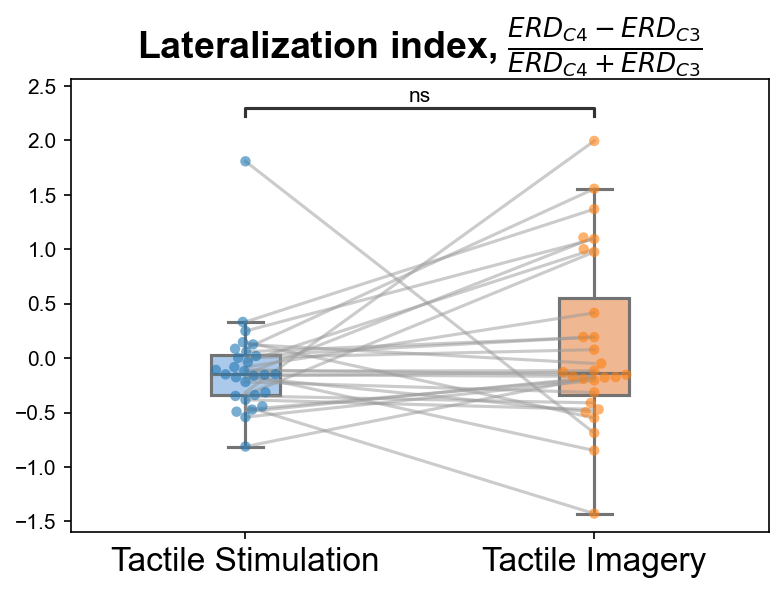

In [19]:
plt.figure(dpi=150)

sns.boxplot(x="variable", y="value", data=df_li, palette='pastel', showfliers=False, width=0.2)
g = sns.swarmplot(x="variable", y="value", data=df_li, alpha=0.6)
sns.lineplot(x="variable", y="value", data=df_li, hue='id', palette=sns.color_palette(["#999999"]*len(not_cond)), alpha=0.5, estimator=None, legend=False)

plt.xlabel('')
plt.ylabel('')

test_results = add_stat_annotation(g, data=df_li, x="variable", y="value",
                                           box_pairs=[('learning', 'imagery')], comparisons_correction=None,
                                           test='Wilcoxon', text_format='star',
                                           loc='inside', verbose=2)
g.set_xticklabels(['Tactile Stimulation', 'Tactile Imagery'], rotation=0, size=16)
plt.title('Lateralization index, $\\frac{ERD_{C4} - ERD_{C3}}{ERD_{C4} + ERD_{C3}}$', fontsize=18, fontweight='bold')

In [20]:
left_sm = [electrodes.index(i) for i in ['C3', 'CP3']]

mu_power_imagery = [np.median(im_long_w[i, left_sm, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2), 50:-50]) for i in range(n_part)]
mu_power_learning = [np.median(stim_long_w[i, left_sm, (np.where(freqs == mu_ind_values[i])[0][0]-1):(np.where(freqs == mu_ind_values[i])[0][0]+2), 50:-50]) for i in range(n_part)]
mu_power_imagery = np.array(mu_power_imagery)
mu_power_learning = np.array(mu_power_learning)
mu_power_imagery *= 100
mu_power_learning *= 100

a, b = np.polyfit(mu_power_learning, mu_power_imagery, deg=1)
a, b

(0.7755320661909151, 2.6253364328489726)

<Figure size 1080x1152 with 0 Axes>

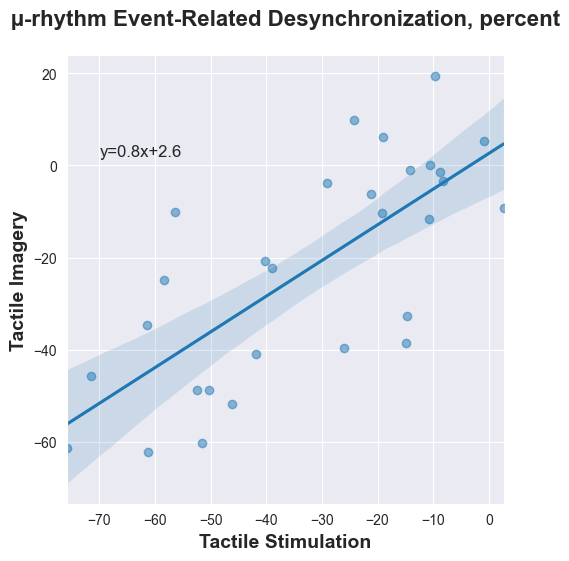

In [21]:
df_mu = pd.DataFrame({'learning':mu_power_learning, 'imagery':mu_power_imagery})
plt.figure(figsize=(15,16))

sns.set_style("darkgrid")
regplot = sns.lmplot(x='learning', y='imagery', data=df_mu, fit_reg=True, ci=95, n_boot=1000, scatter_kws={'alpha':0.5})

# Get the x and y values of the regression line
x, y = regplot.ax.get_lines()[0].get_data()

# Calculate the slope and intercept of the line
slope, intercept = np.polyfit(x, y, 1)

# Add the regression equation as a text on the plot
plt.text(-70, 2, "y={0:.1f}x+{1:.1f}".format(slope,intercept), fontsize=12)

plt.xlabel('Tactile Stimulation', fontsize=14, fontweight='bold')
plt.ylabel('Tactile Imagery', fontsize=14, fontweight='bold')
plt.title('µ-rhythm Event-Related Desynchronization, percent', fontsize=16, fontweight='bold', y=1.05)

regplot.fig.set_dpi(100)
plt.savefig('figs/correlation_ts_ti.jpg', bbox_inches='tight')
plt.show()
sns.set_style("ticks")

In [22]:
stats.spearmanr(mu_power_learning, mu_power_imagery) 
# Spearman correlation statistic for mu-ERD during TS and mu-ERD during TI

SignificanceResult(statistic=0.7310344827586206, pvalue=6.669436578749833e-06)

Mu-ERD during TS is greater than during TI

In [23]:
print('Mu-ERD during TS VS mu-ERD during TI (left sensorimotor area):', stats.wilcoxon(mu_power_imagery, mu_power_learning))
print('\nTS:')
get_stat(mu_power_learning)
print('\nTI:')
get_stat(mu_power_imagery)

Mu-ERD during TS VS mu-ERD during TI (left sensorimotor area): WilcoxonResult(statistic=88.0, pvalue=0.004106286913156509)

TS:
-25.98 [-51.46--14.14]

TI:
-20.73 [-40.84--3.31]


During TS, contra- and ipsilateral mu-ERD differ

During TI, contra- and ipsilateral mu-ERD do not differ

In [24]:
print('TS, Contra mu-ERD VS Ipsi mu-ERD:', stats.wilcoxon(learning_all_e[:, left_sm].mean(axis=1), learning_all_e[:, right_sm].mean(axis=1)))

print('Contra mu-ERD, TS:')
get_stat(learning_all_e[:, left_sm].mean(axis=1))
print('Ipsi mu-ERD, TS:')
get_stat(learning_all_e[:, right_sm].mean(axis=1))

print()
print('TI, Contra mu-ERD VS Ipsi mu-ERD:', stats.wilcoxon(imagery_all_e[:, left_sm].mean(axis=1), imagery_all_e[:, right_sm].mean(axis=1)))

print('Contra mu-ERD, TI:')
get_stat(imagery_all_e[:, left_sm].mean(axis=1))
print('Ipsi mu-ERD, TI:')
get_stat(imagery_all_e[:, right_sm].mean(axis=1))

TS, Contra mu-ERD VS Ipsi mu-ERD: WilcoxonResult(statistic=107.0, pvalue=0.01574459671974182)
Contra mu-ERD, TS:
-0.26 [-0.51--0.14]
Ipsi mu-ERD, TS:
-0.19 [-0.34--0.11]

TI, Contra mu-ERD VS Ipsi mu-ERD: WilcoxonResult(statistic=165.0, pvalue=0.2652079239487648)
Contra mu-ERD, TI:
-0.21 [-0.41--0.03]
Ipsi mu-ERD, TI:
-0.23 [-0.39--0.02]
